In [1]:
import zipfile
import pandas as pd

# Step 1: Unzip the uploaded file
with zipfile.ZipFile('archive (32).zip', 'r') as zip_ref:
    zip_ref.extractall('amazon_data')

# Step 2: Check files inside the extracted folder
import os
os.listdir('amazon_data')


['amazon.csv']

In [2]:
# Load the dataset
df = pd.read_csv('amazon_data/amazon.csv')

# Preview the first 5 rows
df.head()


,product_id,product_name,category,discounted_price,actual_price,discount_percentage,rating,rating_count,about_product,user_id,user_name,review_id,review_title,review_content,img_link,product_link
0,B07JW9H4J1,Wayona Nylon Braided USB to Lightning Fast Cha...,Computers&Accessories|Accessories&Peripherals|...,₹399,"₹1,099",64%,4.2,"24,269",High Compatibility : Compatible With iPhone 12...,"AG3D6O4STAQKAY2UVGEUV46KN35Q,AHMY5CWJMMK5BJRBB...","Manav,Adarsh gupta,Sundeep,S.Sayeed Ahmed,jasp...","R3HXWT0LRP0NMF,R2AJM3LFTLZHFO,R6AQJGUP6P86,R1K...","Satisfied,Charging is really fast,Value for mo...",Looks durable Charging is fine tooNo complains...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Wayona-Braided-WN3LG1-Sy...
1,B098NS6PVG,Ambrane Unbreakable 60W / 3A Fast Charging 1.5...,Computers&Accessories|Accessories&Peripherals|...,₹199,₹349,43%,4.0,"43,994","Compatible with all Type C enabled devices, be...","AECPFYFQVRUWC3KGNLJIOREFP5LQ,AGYYVPDD7YG7FYNBX...","ArdKn,Nirbhay kumar,Sagar Viswanathan,Asp,Plac...","RGIQEG07R9HS2,R1SMWZQ86XIN8U,R2J3Y1WL29GWDE,RY...","A Good Braided Cable for Your Type C Device,Go...",I ordered this cable to connect my phone to An...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Ambrane-Unbreakable-Char...
2,B096MSW6CT,Sounce Fast Phone Charging Cable & Data Sync U...,Computers&Accessories|Accessories&Peripherals|...,₹199,"₹1,899",90%,3.9,"7,928",【 Fast Charger& Data Sync】-With built-in safet...,"AGU3BBQ2V2DDAMOAKGFAWDDQ6QHA,AESFLDV2PT363T2AQ...","Kunal,Himanshu,viswanath,sai niharka,saqib mal...","R3J3EQQ9TZI5ZJ,R3E7WBGK7ID0KV,RWU79XKQ6I1QF,R2...","Good speed for earlier versions,Good Product,W...","Not quite durable and sturdy,https://m.media-a...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Sounce-iPhone-Charging-C...
3,B08HDJ86NZ,boAt Deuce USB 300 2 in 1 Type-C & Micro USB S...,Computers&Accessories|Accessories&Peripherals|...,₹329,₹699,53%,4.2,"94,363",The boAt Deuce USB 300 2 in 1 cable is compati...,"AEWAZDZZJLQUYVOVGBEUKSLXHQ5A,AG5HTSFRRE6NL3M5S...","Omkar dhale,JD,HEMALATHA,Ajwadh a.,amar singh ...","R3EEUZKKK9J36I,R3HJVYCLYOY554,REDECAZ7AMPQC,R1...","Good product,Good one,Nice,Really nice product...","Good product,long wire,Charges good,Nice,I bou...",https://m.media-amazon.com/images/I/41V5FtEWPk...,https://www.amazon.in/Deuce-300-Resistant-Tang...
4,B08CF3B7N1,Portronics Konnect L 1.2M Fast Charging 3A 8 P...,Computers&Accessories|Accessories&Peripherals|...,₹154,₹399,61%,4.2,"16,905",[CHARGE & SYNC FUNCTION]- This cable comes wit...,"AE3Q6KSUK5P75D5HFYHCRAOLODSA,AFUGIFH5ZAFXRDSZH...","rahuls6099,Swasat Borah,Ajay Wadke,Pranali,RVK...","R1BP4L2HH9TFUP,R16PVJEXKV6QZS,R2UPDB81N66T4P,R...","As good as original,Decent,Good one for second...","Bought this instead of original apple, does th...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Portronics-Konnect-POR-1...


In [3]:
# Step 1: Clean column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Step 2: Clean price columns - remove ₹ and commas, convert to float
df['discounted_price'] = df['discounted_price'].replace('[₹,]', '', regex=True).astype(float)
df['actual_price'] = df['actual_price'].replace('[₹,]', '', regex=True).astype(float)

# Step 3: Clean discount column - fix AttributeError
df['discount_percentage'] = df['discount_percentage'].astype(str).str.replace('%', '').replace('nan', '0').astype(float)

# Step 4: Clean rating_count column
df['rating_count'] = df['rating_count'].replace(',', '', regex=True)
df['rating_count'] = df['rating_count'].fillna(0).astype(int)

# Step 5: Fill missing ratings with 0
df['rating'] = df['rating'].fillna(0)

# Confirm cleanup
df.info()
df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1465 entries, 0 to 1464
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   product_id           1465 non-null   object 
 1   product_name         1465 non-null   object 
 2   category             1465 non-null   object 
 3   discounted_price     1465 non-null   float64
 4   actual_price         1465 non-null   float64
 5   discount_percentage  1465 non-null   float64
 6   rating               1465 non-null   object 
 7   rating_count         1465 non-null   int32  
 8   about_product        1465 non-null   object 
 9   user_id              1465 non-null   object 
 10  user_name            1465 non-null   object 
 11  review_id            1465 non-null   object 
 12  review_title         1465 non-null   object 
 13  review_content       1465 non-null   object 
 14  img_link             1465 non-null   object 
 15  product_link         1465 non-null   o

,product_id,product_name,category,discounted_price,actual_price,discount_percentage,rating,rating_count,about_product,user_id,user_name,review_id,review_title,review_content,img_link,product_link
0,B07JW9H4J1,Wayona Nylon Braided USB to Lightning Fast Cha...,Computers&Accessories|Accessories&Peripherals|...,399.0,1099.0,64.0,4.2,24269,High Compatibility : Compatible With iPhone 12...,"AG3D6O4STAQKAY2UVGEUV46KN35Q,AHMY5CWJMMK5BJRBB...","Manav,Adarsh gupta,Sundeep,S.Sayeed Ahmed,jasp...","R3HXWT0LRP0NMF,R2AJM3LFTLZHFO,R6AQJGUP6P86,R1K...","Satisfied,Charging is really fast,Value for mo...",Looks durable Charging is fine tooNo complains...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Wayona-Braided-WN3LG1-Sy...
1,B098NS6PVG,Ambrane Unbreakable 60W / 3A Fast Charging 1.5...,Computers&Accessories|Accessories&Peripherals|...,199.0,349.0,43.0,4.0,43994,"Compatible with all Type C enabled devices, be...","AECPFYFQVRUWC3KGNLJIOREFP5LQ,AGYYVPDD7YG7FYNBX...","ArdKn,Nirbhay kumar,Sagar Viswanathan,Asp,Plac...","RGIQEG07R9HS2,R1SMWZQ86XIN8U,R2J3Y1WL29GWDE,RY...","A Good Braided Cable for Your Type C Device,Go...",I ordered this cable to connect my phone to An...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Ambrane-Unbreakable-Char...
2,B096MSW6CT,Sounce Fast Phone Charging Cable & Data Sync U...,Computers&Accessories|Accessories&Peripherals|...,199.0,1899.0,90.0,3.9,7928,【 Fast Charger& Data Sync】-With built-in safet...,"AGU3BBQ2V2DDAMOAKGFAWDDQ6QHA,AESFLDV2PT363T2AQ...","Kunal,Himanshu,viswanath,sai niharka,saqib mal...","R3J3EQQ9TZI5ZJ,R3E7WBGK7ID0KV,RWU79XKQ6I1QF,R2...","Good speed for earlier versions,Good Product,W...","Not quite durable and sturdy,https://m.media-a...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Sounce-iPhone-Charging-C...
3,B08HDJ86NZ,boAt Deuce USB 300 2 in 1 Type-C & Micro USB S...,Computers&Accessories|Accessories&Peripherals|...,329.0,699.0,53.0,4.2,94363,The boAt Deuce USB 300 2 in 1 cable is compati...,"AEWAZDZZJLQUYVOVGBEUKSLXHQ5A,AG5HTSFRRE6NL3M5S...","Omkar dhale,JD,HEMALATHA,Ajwadh a.,amar singh ...","R3EEUZKKK9J36I,R3HJVYCLYOY554,REDECAZ7AMPQC,R1...","Good product,Good one,Nice,Really nice product...","Good product,long wire,Charges good,Nice,I bou...",https://m.media-amazon.com/images/I/41V5FtEWPk...,https://www.amazon.in/Deuce-300-Resistant-Tang...
4,B08CF3B7N1,Portronics Konnect L 1.2M Fast Charging 3A 8 P...,Computers&Accessories|Accessories&Peripherals|...,154.0,399.0,61.0,4.2,16905,[CHARGE & SYNC FUNCTION]- This cable comes wit...,"AE3Q6KSUK5P75D5HFYHCRAOLODSA,AFUGIFH5ZAFXRDSZH...","rahuls6099,Swasat Borah,Ajay Wadke,Pranali,RVK...","R1BP4L2HH9TFUP,R16PVJEXKV6QZS,R2UPDB81N66T4P,R...","As good as original,Decent,Good one for second...","Bought this instead of original apple, does th...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Portronics-Konnect-POR-1...


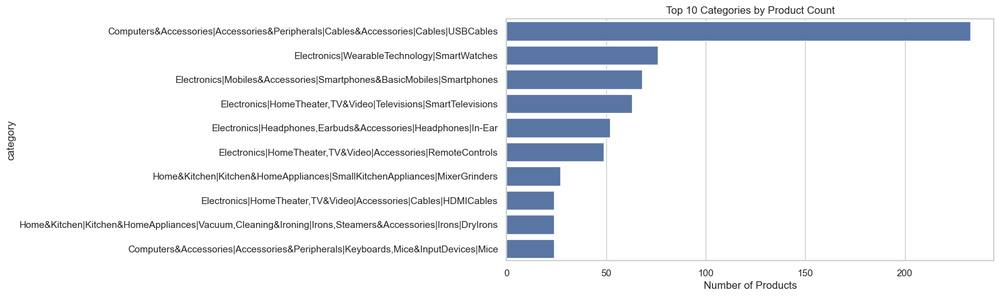

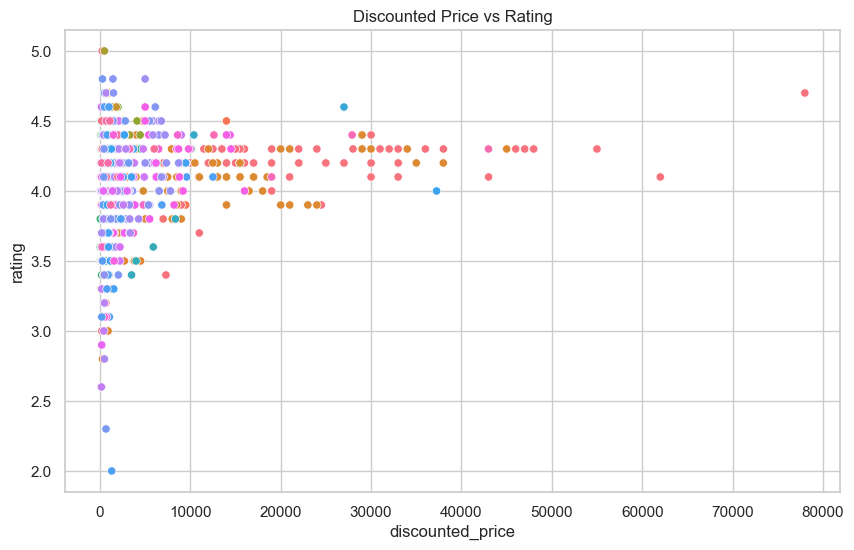

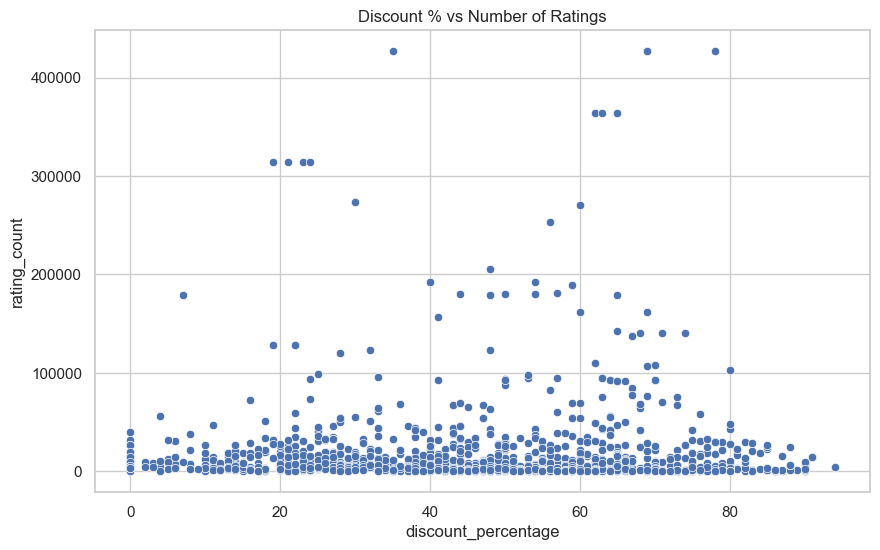

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Top categories by count
top_cats = df['category'].value_counts().head(10)
plt.figure(figsize=(10,5))
sns.barplot(x=top_cats.values, y=top_cats.index)
plt.title("Top 10 Categories by Product Count")
plt.xlabel("Number of Products")
plt.show()

# Price vs Rating
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')  # Convert rating to float
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='discounted_price', y='rating', hue='category', legend=False)
plt.title("Discounted Price vs Rating")
plt.show()

# Discount vs Rating Count
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='discount_percentage', y='rating_count')
plt.title("Discount % vs Number of Ratings")
plt.show()


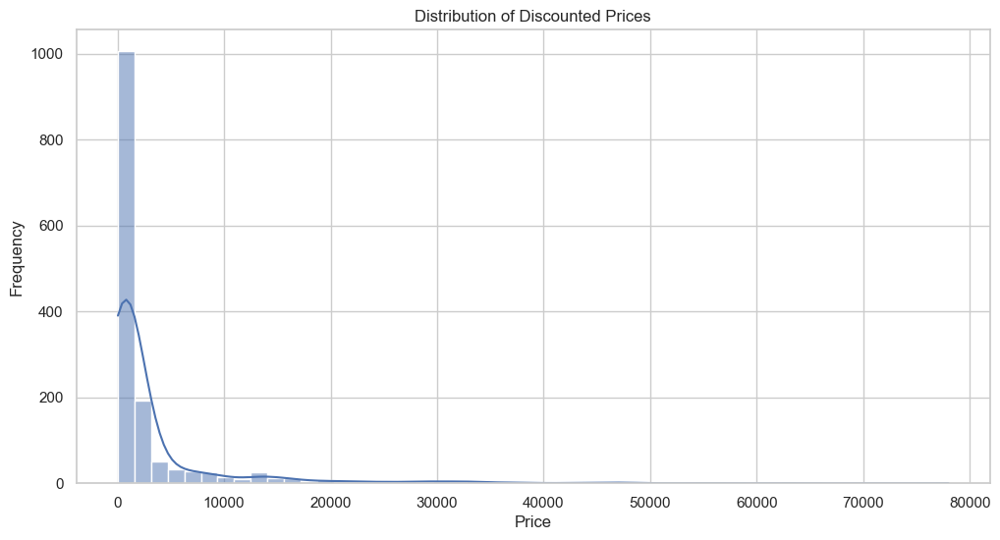

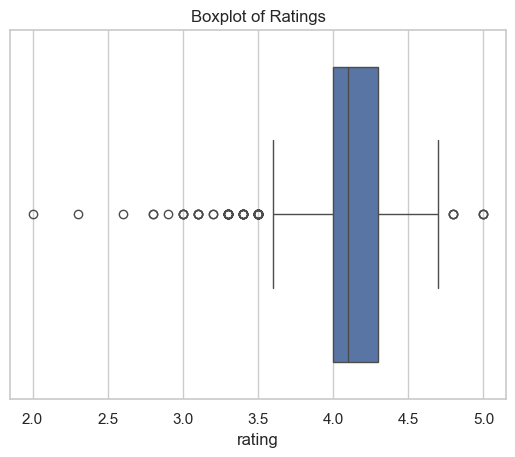

In [5]:
plt.figure(figsize=(12, 6))
sns.histplot(df['discounted_price'], bins=50, kde=True)
plt.title('Distribution of Discounted Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

sns.boxplot(x=df['rating'])
plt.title('Boxplot of Ratings')
plt.show()


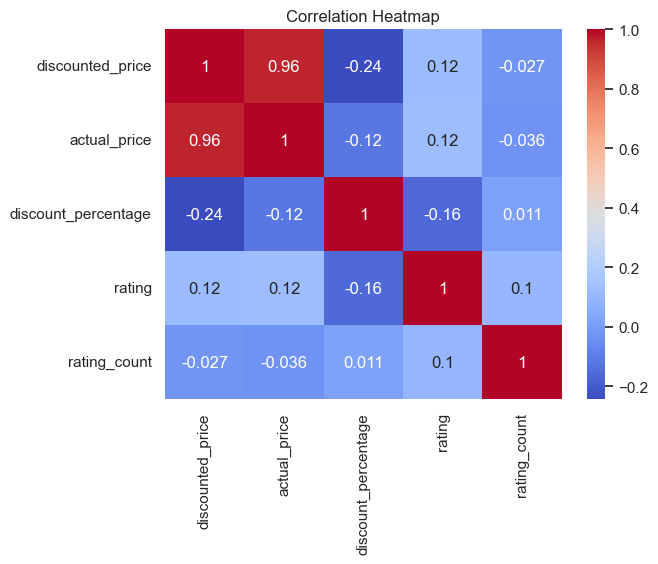

In [6]:
corr = df[['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()


In [7]:
top_rated = df[df['rating'] >= 4.5].sort_values(by='rating_count', ascending=False).head(10)
display(top_rated[['product_name', 'rating', 'rating_count']])


,product_name,rating,rating_count
864,SanDisk Extreme SD UHS I 64GB Card for 4K Vide...,4.5,205052
40,AmazonBasics USB 2.0 Cable - A-Male to B-Male ...,4.5,107687
852,AmazonBasics USB 2.0 Cable - A-Male to B-Male ...,4.5,107686
810,Crucial BX500 240GB 3D NAND SATA 6.35 cm (2.5-...,4.5,92925
212,AmazonBasics USB 2.0 Extension Cable for Perso...,4.5,74977
30,AmazonBasics USB 2.0 - A-Male to A-Female Exte...,4.5,74976
802,AmazonBasics USB 2.0 - A-Male to A-Female Exte...,4.5,74976
734,"Logitech M235 Wireless Mouse, 1000 DPI Optical...",4.5,54405
1145,Swiffer Instant Electric Water Heater Faucet T...,4.8,53803
625,Seagate Expansion 1TB External HDD - USB 3.0 f...,4.5,50810


In [8]:
from scipy.stats import zscore
df['z_rating_count'] = zscore(df['rating_count'])
outliers = df[df['z_rating_count'] > 3]  


array([[<Axes: title={'center': 'rating'}, xlabel='category'>],
       [<Axes: title={'center': 'discount_percentage'}, xlabel='category'>],
       [<Axes: title={'center': 'rating_count'}, xlabel='category'>]],
      dtype=object)

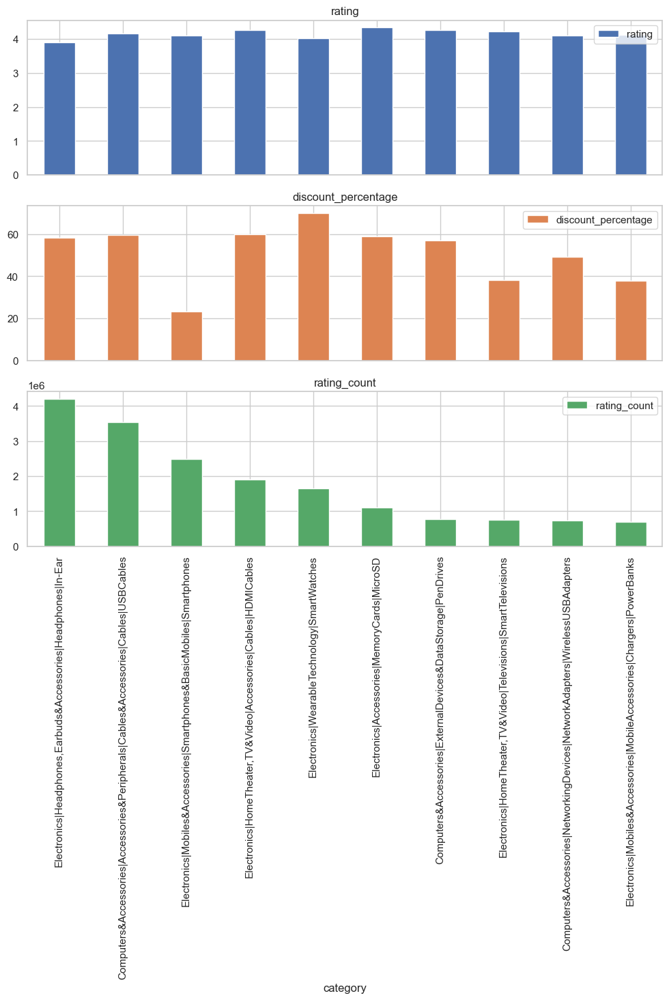

In [9]:
category_summary = df.groupby('category').agg({
    'rating': 'mean',
    'discount_percentage': 'mean',
    'rating_count': 'sum'
}).sort_values(by='rating_count', ascending=False).head(10)

category_summary.plot(kind='bar', subplots=True, figsize=(12, 10), layout=(3, 1), sharex=True)


In [10]:
!pip install textblob


Defaulting to user installation because normal site-packages is not writeable


In [11]:
print(df.columns)


Index(['product_id', 'product_name', 'category', 'discounted_price',
       'actual_price', 'discount_percentage', 'rating', 'rating_count',
       'about_product', 'user_id', 'user_name', 'review_id', 'review_title',
       'review_content', 'img_link', 'product_link', 'z_rating_count'],
      dtype='object')


In [12]:
from textblob import TextBlob

# Drop NaN reviews
df = df.dropna(subset=['review_content'])

# Apply sentiment polarity
df['sentiment_polarity'] = df['review_content'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Classify as Positive, Negative, Neutral
def get_sentiment_label(score):
    if score > 0.1:
        return 'Positive'
    elif score < -0.1:
        return 'Negative'
    else:
        return 'Neutral'

df['sentiment'] = df['sentiment_polarity'].apply(get_sentiment_label)

# Show sample
df[['review_content', 'sentiment_polarity', 'sentiment']].head()


,review_content,sentiment_polarity,sentiment
0,Looks durable Charging is fine tooNo complains...,0.481944,Positive
1,I ordered this cable to connect my phone to An...,0.274318,Positive
2,"Not quite durable and sturdy,https://m.media-a...",0.600000,Positive
3,"Good product,long wire,Charges good,Nice,I bou...",0.240370,Positive
4,"Bought this instead of original apple, does th...",0.262740,Positive


C:\Users\Sreeja Mondal\AppData\Local\Temp\ipykernel_3088\1849574475.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='sentiment', palette='Set2')


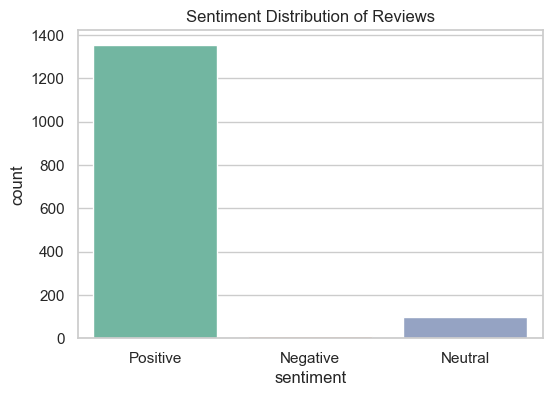

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='sentiment', palette='Set2')
plt.title('Sentiment Distribution of Reviews')
plt.show()


In [14]:
# Convert rating to numeric if not already
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Group by category and product_name
top_products = df.groupby(['category', 'product_name']).agg({
    'rating': 'mean',
    'rating_count': 'sum'
}).reset_index()

# Get top 3 products per category by rating
top_products = top_products.sort_values(['category', 'rating'], ascending=[True, False])
top_3_per_category = top_products.groupby('category').head(3)

top_3_per_category


,category,product_name,rating,rating_count
0,Car&Motorbike|CarAccessories|InteriorAccessori...,Reffair AX30 [MAX] Portable Air Purifier for C...,3.8,1118
2,Computers&Accessories|Accessories&Peripherals|...,"rts [2 Pack] Mini USB C Type C Adapter Plug, T...",4.3,4426
1,Computers&Accessories|Accessories&Peripherals|...,Kanget [2 Pack] Type C Female to USB A Male Ch...,4.0,1540
3,Computers&Accessories|Accessories&Peripherals|...,Hp Wired On Ear Headphones With Mic With 3.5 M...,3.5,7222
5,Computers&Accessories|Accessories&Peripherals|...,JBL Commercial CSLM20B Auxiliary Omnidirection...,3.9,14969
...,...,...,...,...
1332,OfficeProducts|OfficePaperProducts|Paper|Stati...,Pilot V7 Liquid Ink Roller Ball Pen (2 Blue + ...,4.3,2450
1333,OfficeProducts|OfficePaperProducts|Paper|Stati...,Parker Vector Camouflage Gift Set - Roller Bal...,4.3,2493
1335,OfficeProducts|OfficePaperProducts|Paper|Stati...,"Pentonic Multicolor Ball Point Pen, Pack of 10",4.1,4308
1334,OfficeProducts|OfficePaperProducts|Paper|Stati...,Parker Vector Standard Chrome Trim Ball Pen (I...,4.0,3686


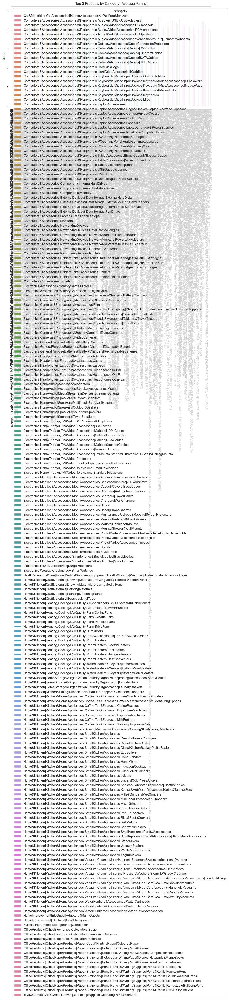

In [15]:
plt.figure(figsize=(12, 6))
sns.barplot(data=top_3_per_category, x='product_name', y='rating', hue='category')
plt.xticks(rotation=90)
plt.title('Top 3 Products by Category (Average Rating)')
plt.show()


In [16]:
# Ensure 'review_content' is cleaned and non-null
df = df.dropna(subset=['review_content'])

# Apply TextBlob sentiment
df['polarity'] = df['review_content'].apply(lambda x: TextBlob(x).sentiment.polarity)
df['subjectivity'] = df['review_content'].apply(lambda x: TextBlob(x).sentiment.subjectivity)


In [17]:
def get_sentiment(p):
    if p > 0.1:
        return 'Positive'
    elif p < -0.1:
        return 'Negative'
    else:
        return 'Neutral'

df['sentiment_category'] = df['polarity'].apply(get_sentiment)


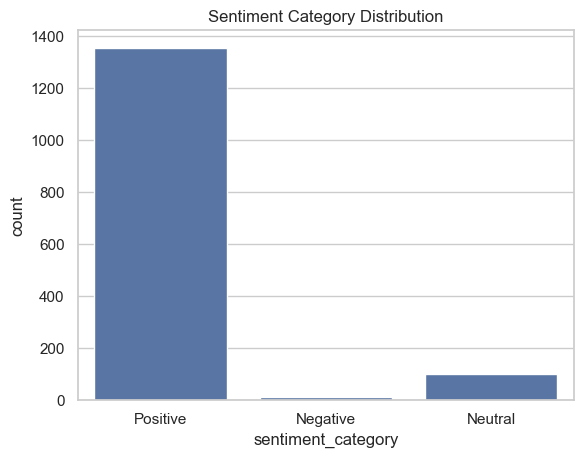

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x='sentiment_category', data=df)
plt.title('Sentiment Category Distribution')
plt.show()


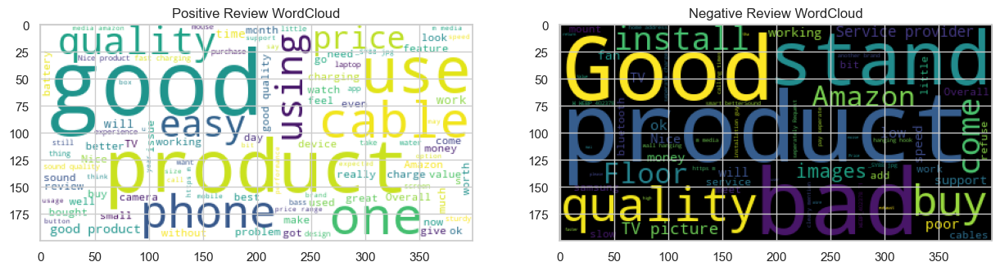

In [19]:
from wordcloud import WordCloud

# Join reviews
positive_text = " ".join(df[df['sentiment_category'] == 'Positive']['review_content'])
negative_text = " ".join(df[df['sentiment_category'] == 'Negative']['review_content'])

# Plot Word Clouds
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
plt.imshow(WordCloud(background_color='white', max_words=100).generate(positive_text))
plt.title("Positive Review WordCloud")

plt.subplot(1,2,2)
plt.imshow(WordCloud(background_color='black', max_words=100).generate(negative_text))
plt.title("Negative Review WordCloud")
plt.show()


In [20]:
!pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable


In [21]:
category_stats = df.groupby('category').agg({
    'rating': 'mean',
    'discount_percentage': 'mean',
    'actual_price': 'mean',
    'discounted_price': 'mean'
}).reset_index()

category_stats = category_stats.sort_values(by='rating', ascending=False)


C:\Users\Sreeja Mondal\AppData\Local\Temp\ipykernel_3088\1426828919.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=category_stats, x='rating', y='category', palette='viridis')


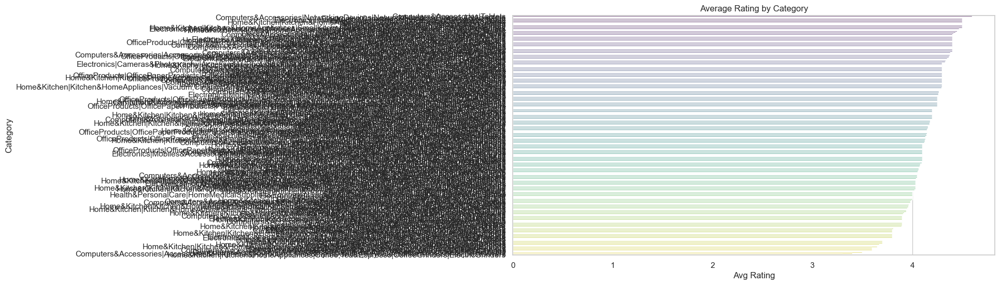

In [22]:
plt.figure(figsize=(12,6))
sns.barplot(data=category_stats, x='rating', y='category', palette='viridis')
plt.title("Average Rating by Category")
plt.xlabel("Avg Rating")
plt.ylabel("Category")
plt.show()


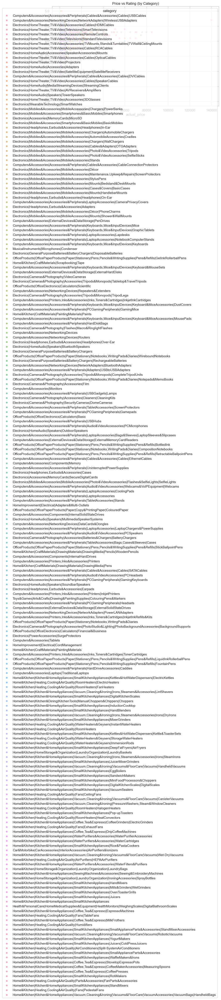

In [23]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='actual_price', y='rating', hue='category', alpha=0.6)
plt.title("Price vs Rating (by Category)")
plt.show()


In [24]:
# Price difference
df['price_diff'] = df['discounted_price'] - df['actual_price']

# Review length
df['review_length'] = df['review_content'].astype(str).apply(len)

# Word count
df['word_count'] = df['review_content'].astype(str).apply(lambda x: len(x.split()))


In [25]:
list(df.columns)


['product_id',
 'product_name',
 'category',
 'discounted_price',
 'actual_price',
 'discount_percentage',
 'rating',
 'rating_count',
 'about_product',
 'user_id',
 'user_name',
 'review_id',
 'review_title',
 'review_content',
 'img_link',
 'product_link',
 'z_rating_count',
 'sentiment_polarity',
 'sentiment',
 'polarity',
 'subjectivity',
 'sentiment_category',
 'price_diff',
 'review_length',
 'word_count']

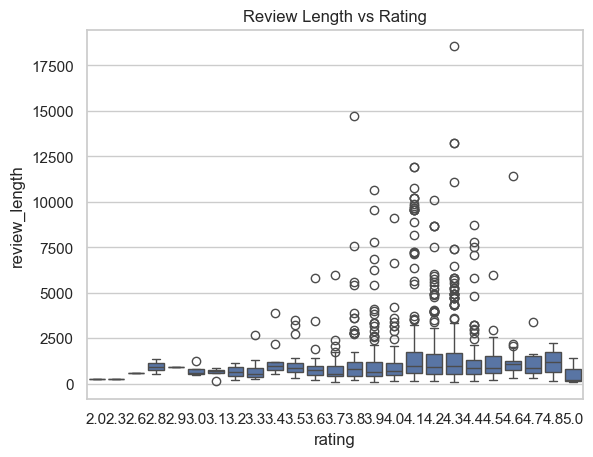

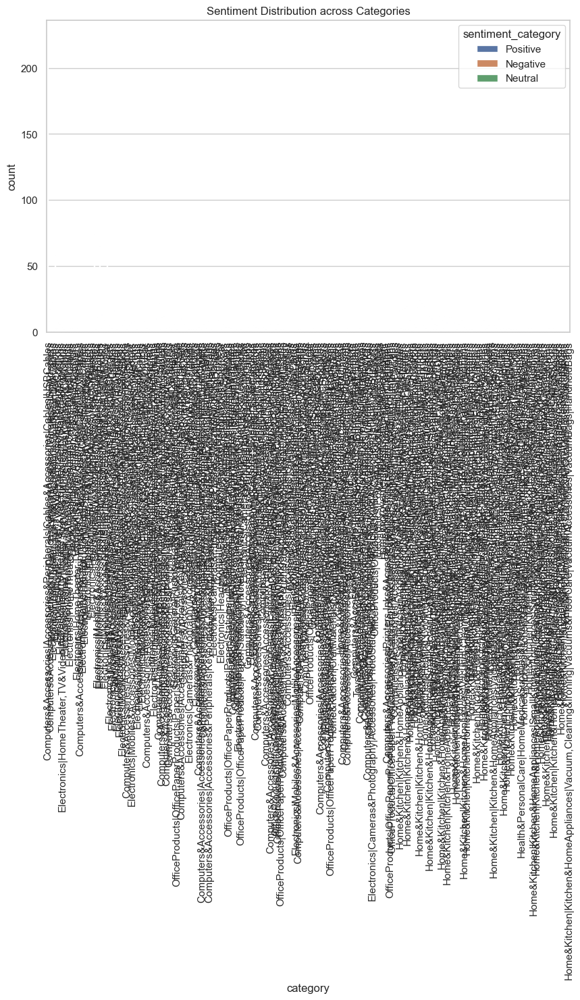

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Relationship between rating and review length
sns.boxplot(x='rating', y='review_length', data=df)
plt.title("Review Length vs Rating")
plt.show()

# Distribution of Sentiment Categories across Categories
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='category', hue='sentiment_category')
plt.xticks(rotation=90)
plt.title("Sentiment Distribution across Categories")
plt.show()


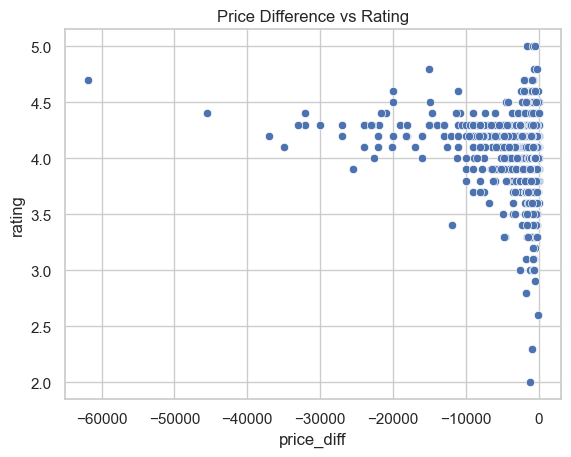

In [27]:
sns.scatterplot(x='price_diff', y='rating', data=df)
plt.title("Price Difference vs Rating")
plt.show()


In [28]:
# Top products with most positive sentiment and high ratings
top_products = df[df['sentiment_category'] == 'Positive'].groupby('product_name').agg({
    'rating': 'mean',
    'review_id': 'count'
}).sort_values(by=['rating', 'review_id'], ascending=False).head(10)
top_products


,rating,review_id
product_name,,
"Amazon Basics Wireless Mouse | 2.4 GHz Connection, 1600 DPI | Type - C Adapter | Upto 12 Months of Battery Life | Ambidextrous Design | Suitable for PC/Mac/Laptop",5.0,1
"REDTECH USB-C to Lightning Cable 3.3FT, [Apple MFi Certified] Lightning to Type C Fast Charging Cord Compatible with iPhone 14/13/13 pro/Max/12/11/X/XS/XR/8, Supports Power Delivery - White",5.0,1
"Syncwire LTG to USB Cable for Fast Charging Compatible with Phone 5/ 5C/ 5S/ 6/ 6S/ 7/8/ X/XR/XS Max/ 11/12/ 13 Series and Pad Air/Mini, Pod & Other Devices (1.1 Meter, White)",5.0,1
"Instant Pot Air Fryer, Vortex 2QT, Touch Control Panel, 360° EvenCrisp™ Technology, Uses 95 % less Oil, 4-in-1 Appliance: Air Fry, Roast, Bake, Reheat (Vortex 1.97Litre, Black)",4.8,1
"Oratech Coffee Frother electric, milk frother electric, coffee beater, cappuccino maker, Coffee Foamer, Mocktail Mixer, Coffee Foam Maker, coffee whisker electric, Froth Maker, coffee stirrers electric, coffee frothers, Coffee Blender, (6 Month Warranty) (Multicolour)",4.8,1
"Swiffer Instant Electric Water Heater Faucet Tap Home-Kitchen Instantaneous Water Heater Tank less for Tap, LED Electric Head Water Heaters Tail Gallon Comfort(3000W) ((Pack of 1))",4.8,1
Campfire Spring Chef Prolix Instant Portable Water Heater Geyser 1Ltr. for Use Home Stainless Steel Baking Rack | Restaurant | Office | Labs | Clinics | Saloon | with Installation Kit (With MCB),4.7,1
"FIGMENT Handheld Milk Frother Rechargeable, 3-Speed Electric Frother for Coffee with 2 Whisks and Coffee Decoration Tool, Coffee Frother Mixer, CRESCENT ENTERPRISES VRW0.50BK (A1)",4.7,1
Multifunctional 2 in 1 Electric Egg Boiling Steamer Egg Frying Pan Egg Boiler Electric Automatic Off with Egg Boiler Machine Non-Stick Electric Egg Frying Pan-Tiger Woods (Multy),4.7,1


In [29]:
#NLP-Based Keyword Extraction from Reviews
from sklearn.feature_extraction.text import TfidfVectorizer

# Filter only positive reviews
positive_reviews = df[df['sentiment_category'] == 'Positive']['review_content']

# Apply TF-IDF
tfidf = TfidfVectorizer(max_features=10, stop_words='english')
tfidf_matrix = tfidf.fit_transform(positive_reviews)

# Top keywords
feature_names = tfidf.get_feature_names_out()
tfidf_scores = tfidf.idf_
keywords_df = pd.DataFrame({'Keyword': feature_names, 'TF-IDF': tfidf_scores})
keywords_df.sort_values(by='TF-IDF', ascending=True)


,Keyword,TF-IDF
2,good,1.026170
6,product,1.100861
7,quality,1.400312
8,use,1.608969
5,price,1.624007
3,like,1.764251
9,using,1.857187
0,cable,2.365118
1,charging,2.427732
4,phone,2.501130


In [30]:
#Clustering Reviews
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(df['review_content'].dropna())

kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X)

df['cluster'] = kmeans.labels_



In [31]:
top_rated_products = df.groupby('product_name').agg({
    'rating': 'mean',
    'rating_count': 'sum'
}).sort_values(by=['rating', 'rating_count'], ascending=False).head(10)
top_rated_products


,rating,rating_count
product_name,,
"Amazon Basics Wireless Mouse | 2.4 GHz Connection, 1600 DPI | Type - C Adapter | Upto 12 Months of Battery Life | Ambidextrous Design | Suitable for PC/Mac/Laptop",5.0,23
"Syncwire LTG to USB Cable for Fast Charging Compatible with Phone 5/ 5C/ 5S/ 6/ 6S/ 7/8/ X/XR/XS Max/ 11/12/ 13 Series and Pad Air/Mini, Pod & Other Devices (1.1 Meter, White)",5.0,5
"REDTECH USB-C to Lightning Cable 3.3FT, [Apple MFi Certified] Lightning to Type C Fast Charging Cord Compatible with iPhone 14/13/13 pro/Max/12/11/X/XS/XR/8, Supports Power Delivery - White",5.0,0
"Swiffer Instant Electric Water Heater Faucet Tap Home-Kitchen Instantaneous Water Heater Tank less for Tap, LED Electric Head Water Heaters Tail Gallon Comfort(3000W) ((Pack of 1))",4.8,53803
"Instant Pot Air Fryer, Vortex 2QT, Touch Control Panel, 360° EvenCrisp™ Technology, Uses 95 % less Oil, 4-in-1 Appliance: Air Fry, Roast, Bake, Reheat (Vortex 1.97Litre, Black)",4.8,3964
"Oratech Coffee Frother electric, milk frother electric, coffee beater, cappuccino maker, Coffee Foamer, Mocktail Mixer, Coffee Foam Maker, coffee whisker electric, Froth Maker, coffee stirrers electric, coffee frothers, Coffee Blender, (6 Month Warranty) (Multicolour)",4.8,28
Spigen EZ Fit Tempered Glass Screen Protector for iPhone 14 Pro Max - 2 Pack (Sensor Protection),4.7,7779
Sony Bravia 164 cm (65 inches) 4K Ultra HD Smart LED Google TV KD-65X74K (Black),4.7,5935
Campfire Spring Chef Prolix Instant Portable Water Heater Geyser 1Ltr. for Use Home Stainless Steel Baking Rack | Restaurant | Office | Labs | Clinics | Saloon | with Installation Kit (With MCB),4.7,2591


In [32]:
summary_df = pd.DataFrame({
    "Average Rating": [df['rating'].mean()],
    "Total Reviews": [df['review_id'].nunique()],
    "Average Discount (%)": [df['discount_percentage'].mean()],
    "Most Frequent Category": [df['category'].mode()[0]]
})
summary_df


,Average Rating,Total Reviews,Average Discount (%),Most Frequent Category
0,4.096585,1194,47.691468,Computers&Accessories|Accessories&Peripherals|...


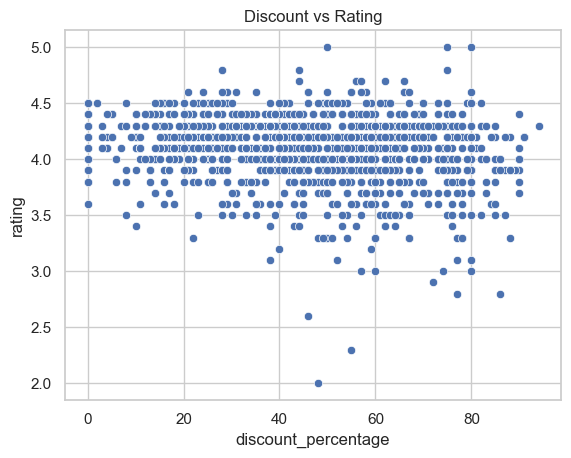

In [33]:
sns.scatterplot(data=df, x='discount_percentage', y='rating')
plt.title("Discount vs Rating")
plt.show()


<Axes: xlabel='sentiment_category', ylabel='discount_percentage'>

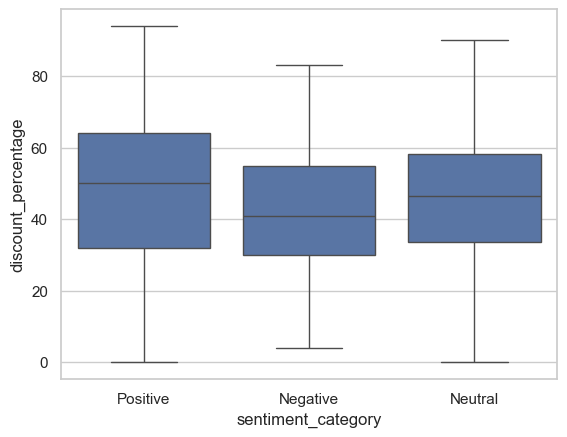

In [34]:
sns.boxplot(x='sentiment_category', y='discount_percentage', data=df)


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
X = vectorizer.fit_transform(df['review_content'])
lda = LatentDirichletAllocation(n_components=3, random_state=42)
lda.fit(X)
